# Creating Animations of Fire Density

In [47]:
import geopandas as gpd
import geoplot
import numpy as np
import pandas as pd
import calendar

import matplotlib.pyplot as plt
from matplotlib import cm as cm
from matplotlib import mlab as ml
from matplotlib import gridspec


import seaborn as sns

plt.ion() # turn on interactive plotting
plt.rcParams['figure.figsize'] = [20, 15] # enlarge the default plotting size

from sklearn.neighbors import KernelDensity

from mpl_toolkits.basemap import Basemap



fire_path="I:/Thailand_Haze/fire_data/"
gis_path="I:/Thailand_Haze/GIS_data/"

# 1. Data loading and exploration

In [48]:
modis_df = gpd.read_file(fire_path+"DL_FIRE_M6_100701/fire_archive_M6_100701.shp")

In [49]:
modis_df.head()

,LATITUDE,LONGITUDE,BRIGHTNESS,SCAN,TRACK,ACQ_DATE,ACQ_TIME,SATELLITE,INSTRUMENT,CONFIDENCE,VERSION,BRIGHT_T31,FRP,DAYNIGHT,TYPE,geometry
0,14.1158,101.9957,302.7,1.1,1.0,2000-11-01,1554,Terra,MODIS,51,6.2,290.5,5.5,N,0,POINT (101.9957 14.1158)
1,14.1291,101.9528,302.2,1.1,1.0,2000-11-01,1554,Terra,MODIS,48,6.2,290.2,5.0,N,0,POINT (101.9528 14.1291)
2,26.6134,101.5979,327.9,1.1,1.0,2000-11-02,0405,Terra,MODIS,85,6.2,294.9,27.5,D,2,POINT (101.5979 26.6134)
3,23.4863,104.5952,302.8,1.1,1.0,2000-11-02,0405,Terra,MODIS,33,6.2,292.7,3.0,D,0,POINT (104.5952 23.4863)
4,26.5647,101.6782,311.1,1.1,1.0,2000-11-02,0405,Terra,MODIS,71,6.2,296.0,8.2,D,2,POINT (101.6782 26.5647)


In [50]:
modis_df['lon']=modis_df.geometry.x
modis_df['lat']=modis_df.geometry.y

In [51]:
ll_lon=modis_df['lon'].min() - 3
ll_lat=modis_df['lat'].min() - 3

ur_lon=modis_df['lon'].max() + 3
ur_lat=modis_df['lat'].max() + 3

In [52]:
country = gpd.read_file(gis_path+"thailand_surr_wgs84.shp")
thailand = country[country['COUNTRY']=='TH']


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  import sys


http://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/export?bbox=85.6704,-2.0698,112.4226,31.829700000000003&bboxSR=4269&imageSR=4269&size=2000,2534&dpi=96&format=png32&transparent=true&f=image


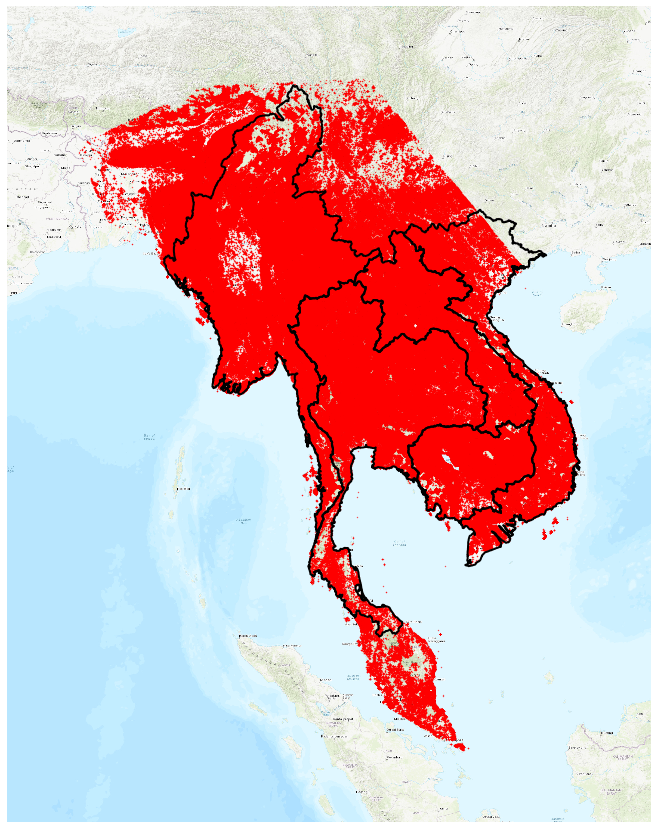

In [53]:
# create an empty canvas for plotting (i.e. ax1)
f, ax1 = plt.subplots(1, figsize=(20, 15))

# extract DUI locations

# add a basemap as the bottom layer
map = Basemap(llcrnrlon=ll_lon,llcrnrlat=ll_lat,urcrnrlon=ur_lon,urcrnrlat=ur_lat, epsg=4269, ax=ax1)
map.arcgisimage(service='World_Topo_Map', xpixels = 2000, verbose= True)

# plot the kernel density of DUI points
#country.plot(ax=ax1)

modis_df.plot(marker='o', color='red', markersize=0.1,ax=ax1)
country.plot(color=None, facecolor='none', edgecolors="black",linewidth =2,ax=ax1)

# sns.kdeplot(DUI['Longitude'], DUI['Latitude'],shade= True,  n_levels=50, shade_lowest=False,
#             bw=0.01,cmap='Purples',alpha = 0.3, ax=ax1);

ax1.set_axis_off()

plt.show()

## Attach countries to the dataframe

In [54]:
modis_df= gpd.sjoin(modis_df, country, how="left", op='intersects')

## Select only points in Thailand

In [56]:
modis_df_th = modis_df[modis_df['COUNTRY']=='TH']

## Convert String to DateTime

In [63]:
modis_df_th['date_time'] = modis_df_th['ACQ_DATE'] +" "+ modis_df_th['ACQ_TIME']
modis_df_th['date_time']= pd.to_datetime(modis_df_th['date_time'])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [65]:
modis_df_th=modis_df_th[modis_df_th['date_time'] > '2001-1-1']

## Hexagon density map

In [67]:
ll_lon_th=float(thailand.bounds['minx']) - 1
ll_lat_th=float(thailand.bounds['miny']) - 1

ur_lon_th=float(thailand.bounds['maxx']) + 1
ur_lat_th=float(thailand.bounds['maxy']) + 1

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  import sys


http://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/export?bbox=96.3452606201172,4.631110191345216,106.63942718505862,21.45527267456054&bboxSR=4269&imageSR=4269&size=2000,3268&dpi=96&format=png32&transparent=true&f=image


No handles with labels found to put in legend.


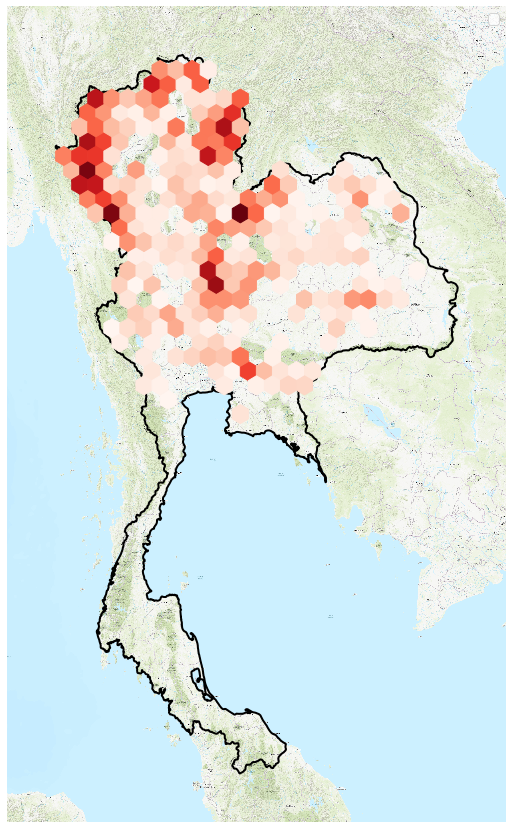

In [68]:
# create an empty canvas for plotting (i.e. ax1)
f, ax1 = plt.subplots(1, figsize=(20, 15))

# extract DUI locations

# add a basemap as the bottom layer
map = Basemap(llcrnrlon=ll_lon_th,llcrnrlat=ll_lat_th,urcrnrlon=ur_lon_th,urcrnrlat=ur_lat_th, epsg=4269, ax=ax1)
map.arcgisimage(service='World_Topo_Map', xpixels = 2000, verbose= True)


#x = np.array(modis_df['lon'])
#y = np.array(modis_df['lat'])

thailand.plot(color=None, facecolor='none', edgecolors="black",linewidth =2,ax=ax1)

plt.hexbin(modis_df_th['lon'], modis_df_th['lat'], gridsize=(25,25), cmap=plt.cm.Reds,mincnt=1000)

plt.legend()
ax1.set_axis_off()

plt.show()

## Kernel Density Map (#CAUTION: Take a long time)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  import sys


http://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/export?bbox=96.3452606201172,4.631110191345216,106.63942718505862,21.45527267456054&bboxSR=4269&imageSR=4269&size=2000,3268&dpi=96&format=png32&transparent=true&f=image


No handles with labels found to put in legend.


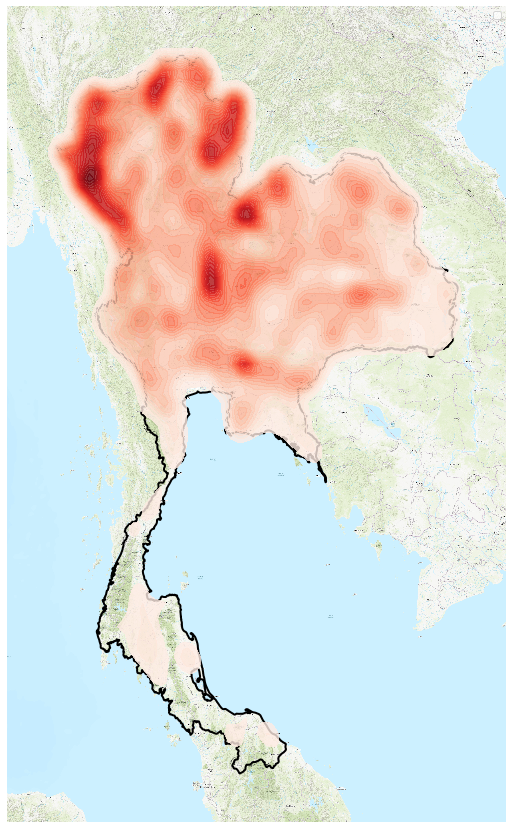

In [12]:
# create an empty canvas for plotting (i.e. ax1)
f, ax1 = plt.subplots(1, figsize=(20, 15))

# extract DUI locations

# add a basemap as the bottom layer
map = Basemap(llcrnrlon=ll_lon_th,llcrnrlat=ll_lat_th,urcrnrlon=ur_lon_th,urcrnrlat=ur_lat_th, epsg=4269, ax=ax1)
map.arcgisimage(service='World_Topo_Map', xpixels = 2000, verbose= True)


thailand.plot(color=None, facecolor='none', edgecolors="black",linewidth =2,ax=ax1)

sns.kdeplot(modis_df_th['lon'], modis_df_th['lat'],shade= True,  n_levels=30, shade_lowest=False,cmap=plt.cm.Reds,alpha = 0.8, ax=ax1);

plt.legend()
ax1.set_axis_off()

plt.show()

# 2. Create annual maps

### Numbers of fire points per year

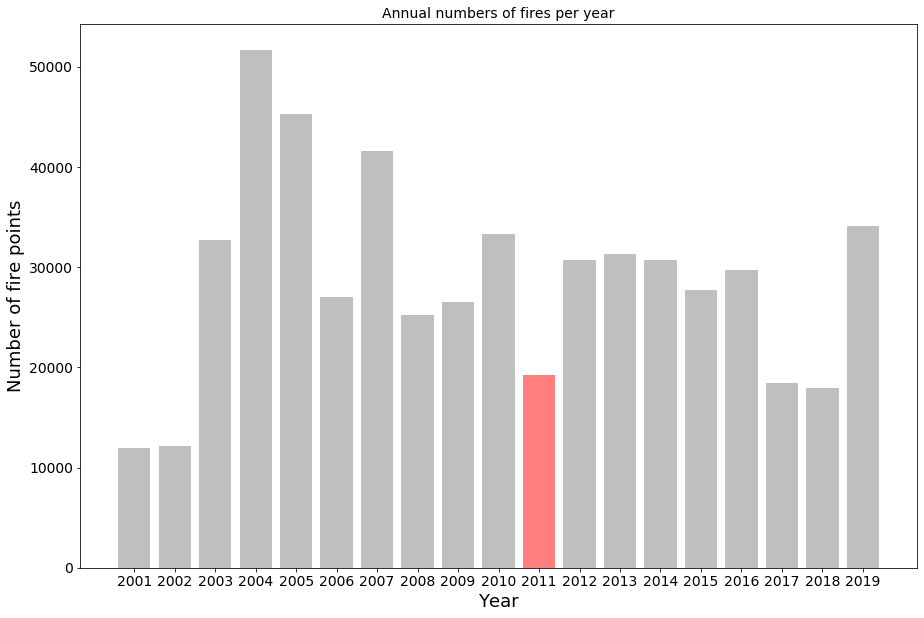

In [69]:
SMALL_SIZE = 14
MEDIUM_SIZE = 18
BIGGER_SIZE = 22

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

year_ls = list(modis_df_th['date_time'].dt.year.unique())
y_pos=np.arange(len(year_ls))
num_f = list(modis_df_th.groupby(modis_df_th['date_time'].dt.year)['date_time'].count())
color_ls = ['grey']*len(year_ls)
color_ls[10]='red'

plt.rcParams['figure.figsize'] = [15, 10] # enlarge the default plotting size
plt.bar(y_pos, num_f, color=color_ls, align='center', alpha=0.5)
plt.xticks(y_pos, year_ls)
plt.ylabel('Number of fire points')
plt.xlabel('Year')
plt.title('Annual numbers of fires per year')

plt.show()

### Numbers of fire points per month

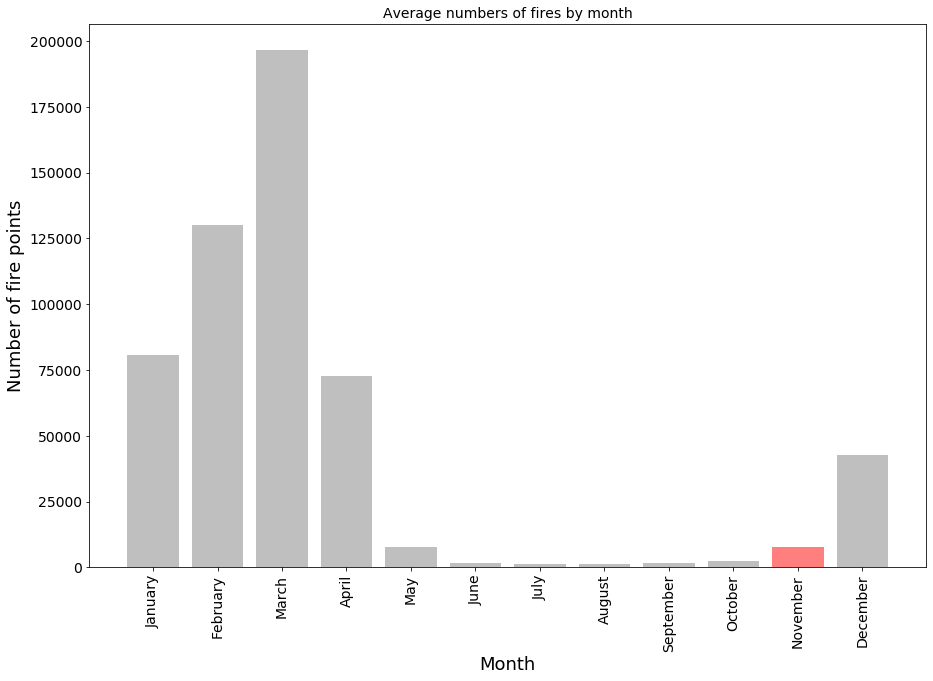

In [70]:
month_ls = list(modis_df_th['date_time'].dt.month.unique())
month_ls.sort()
month_ls_tx = ['January', 'February', 'March', 'April', 'May', 'June', 'July',
              'August', 'September', 'October', 'November', 'December']

y_pos=np.arange(len(month_ls))
num_f = list(modis_df_th.groupby(modis_df_th['date_time'].dt.month)['date_time'].count())
color_ls = ['grey']*len(month_ls)
color_ls[10]='red'

plt.rcParams['figure.figsize'] = [15, 10] # enlarge the default plotting size
plt.bar(y_pos, num_f, color=color_ls, align='center', alpha=0.5)
plt.xticks(y_pos, month_ls_tx,rotation=90)
plt.ylabel('Number of fire points')
plt.xlabel('Month')
plt.title('Average numbers of fires by month')

plt.show()

### Number of fire points in different months per year

In [23]:
modis_df_th.head()

,LATITUDE,LONGITUDE,BRIGHTNESS,SCAN,TRACK,ACQ_DATE,ACQ_TIME,SATELLITE,INSTRUMENT,CONFIDENCE,...,lat,index_right,AREA,COUNTRY,CNTRY_NAME,REGION,CONTINENT,LAND_OCEAN,date_time,month
0,14.1158,101.9957,302.7,1.1,1.0,2000-11-01,1554,Terra,MODIS,51,...,14.1158,3.0,43.032,TH,Thailand,Southeastern Asia,Asia,Continent,2000-11-01 15:54:00,11
1,14.1291,101.9528,302.2,1.1,1.0,2000-11-01,1554,Terra,MODIS,48,...,14.1291,3.0,43.032,TH,Thailand,Southeastern Asia,Asia,Continent,2000-11-01 15:54:00,11
9,16.1908,101.9990,309.3,1.0,1.0,2000-11-02,0407,Terra,MODIS,59,...,16.1908,3.0,43.032,TH,Thailand,Southeastern Asia,Asia,Continent,2000-11-02 04:07:00,11
10,16.9326,103.0034,311.4,1.1,1.0,2000-11-02,0407,Terra,MODIS,48,...,16.9326,3.0,43.032,TH,Thailand,Southeastern Asia,Asia,Continent,2000-11-02 04:07:00,11
14,13.6644,101.8149,310.2,1.0,1.0,2000-11-02,0408,Terra,MODIS,57,...,13.6644,3.0,43.032,TH,Thailand,Southeastern Asia,Asia,Continent,2000-11-02 04:08:00,11


In [22]:
modis_df_th['month']=pd.DatetimeIndex(modis_df_th['date_time']).month

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


#### Group fire points by year and month, and re-organize them in a dataframe

In [113]:
modis_df_th_month = pd.DataFrame(modis_df_th.groupby([modis_df_th['date_time'].dt.year,modis_df_th['date_time'].dt.month]).count()['date_time'])
modis_df_th_month = modis_df_th_month.rename(columns={"date_time": "count"})
modis_df_th_month.index.names = ['year','month']
modis_df_th_month=modis_df_th_month.reset_index()

Text(0, 0.5, 'Number of fire points')

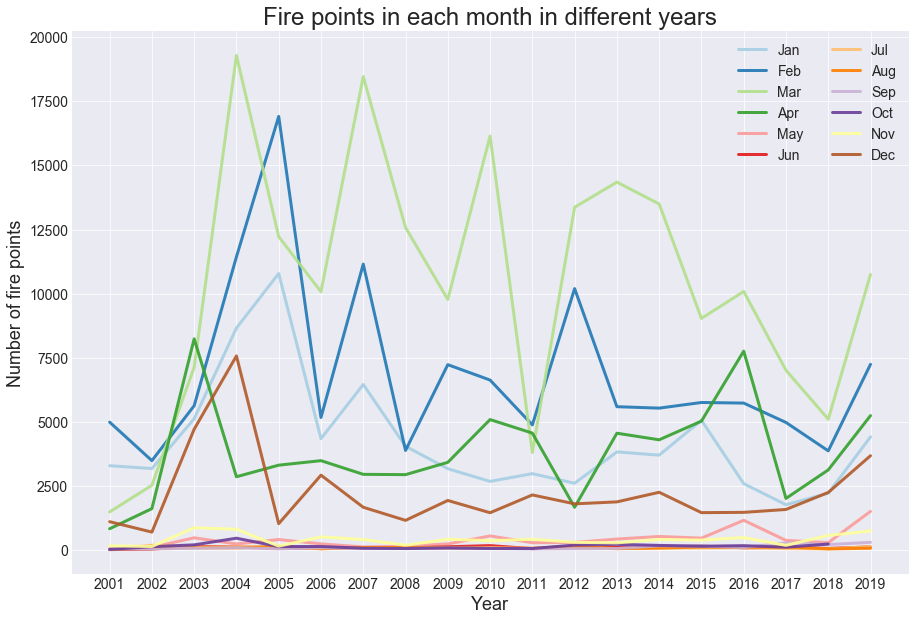

In [162]:
# Make a data frame
df = pd.DataFrame({'x': range(1,11), 'y1': np.random.randn(10), 'y2': np.random.randn(10)+range(1,11), 'y3': np.random.randn(10)+range(11,21), 'y4': np.random.randn(10)+range(6,16), 'y5': np.random.randn(10)+range(4,14)+(0,0,0,0,0,0,0,-3,-8,-6), 'y6': np.random.randn(10)+range(2,12), 'y7': np.random.randn(10)+range(5,15), 'y8': np.random.randn(10)+range(4,14), 'y9': np.random.randn(10)+range(4,14), 'y10': np.random.randn(10)+range(2,12) })
 
# style
plt.style.use('seaborn-darkgrid')
 
# create a color palette
palette = plt.get_cmap('Paired')
 
# multiple line plot
num=0

for mon in list(modis_df_th_month['month'].unique()):
    y = modis_df_th_month[modis_df_th_month['month'] == mon]['count']
    x = modis_df_th_month[modis_df_th_month['month'] == mon]['year']

    plt.plot(x, y, marker='', color=palette(num), linewidth=3, alpha=0.9, label=calendar.month_abbr[mon])
    num+=1

# Add legend
plt.legend(loc='upper right',ncol=2)
plt.xticks(np.arange(2001, 2020, step=1))
# Add titles
plt.title("Fire points in each month in different years", loc='Center', fontsize=24, fontweight=0)
plt.xlabel("Year")
plt.ylabel("Number of fire points")


## Fire point density per year

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  del sys.path[0]


http://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/export?bbox=96.3452606201172,4.631110191345216,106.63942718505862,21.45527267456054&bboxSR=4269&imageSR=4269&size=2000,3268&dpi=96&format=png32&transparent=true&f=image


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:36: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


http://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/export?bbox=96.3452606201172,4.631110191345216,106.63942718505862,21.45527267456054&bboxSR=4269&imageSR=4269&size=2000,3268&dpi=96&format=png32&transparent=true&f=image
http://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/export?bbox=96.3452606201172,4.631110191345216,106.63942718505862,21.45527267456054&bboxSR=4269&imageSR=4269&size=2000,3268&dpi=96&format=png32&transparent=true&f=image
http://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/export?bbox=96.3452606201172,4.631110191345216,106.63942718505862,21.45527267456054&bboxSR=4269&imageSR=4269&size=2000,3268&dpi=96&format=png32&transparent=true&f=image
http://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/export?bbox=96.3452606201172,4.631110191345216,106.63942718505862,21.45527267456054&bboxSR=4269&imageSR=4269&size=2000,3268&dpi=96&format=png32&transparent=true&f=image
http://server.ar

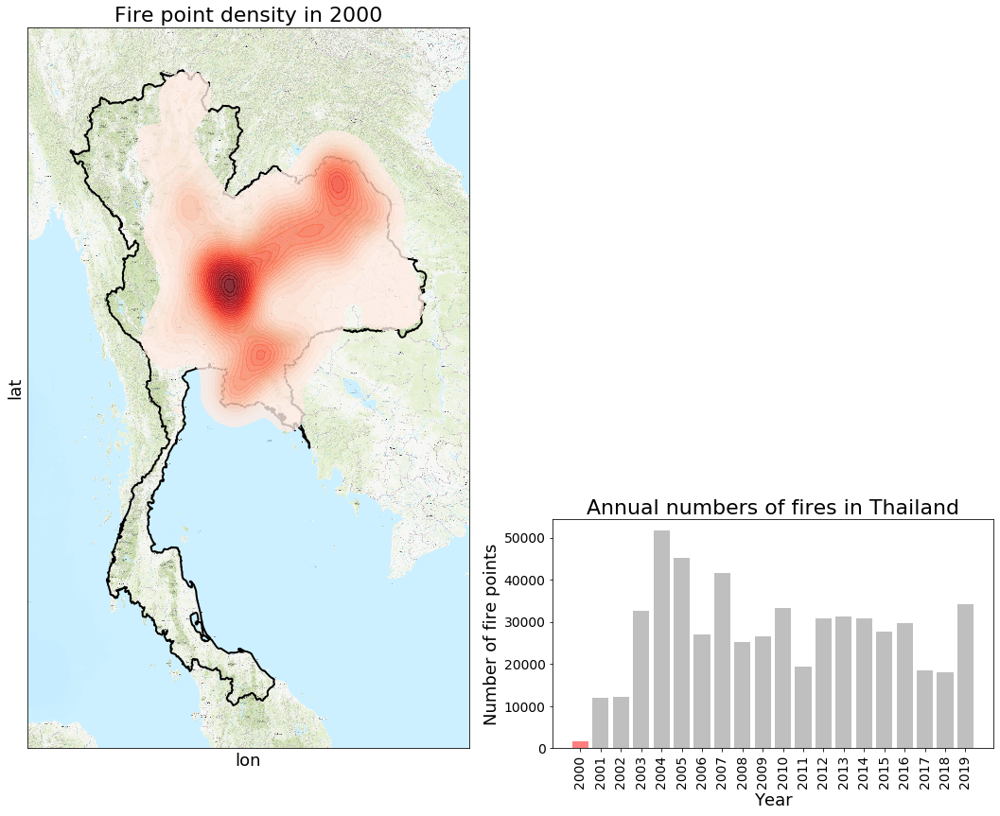

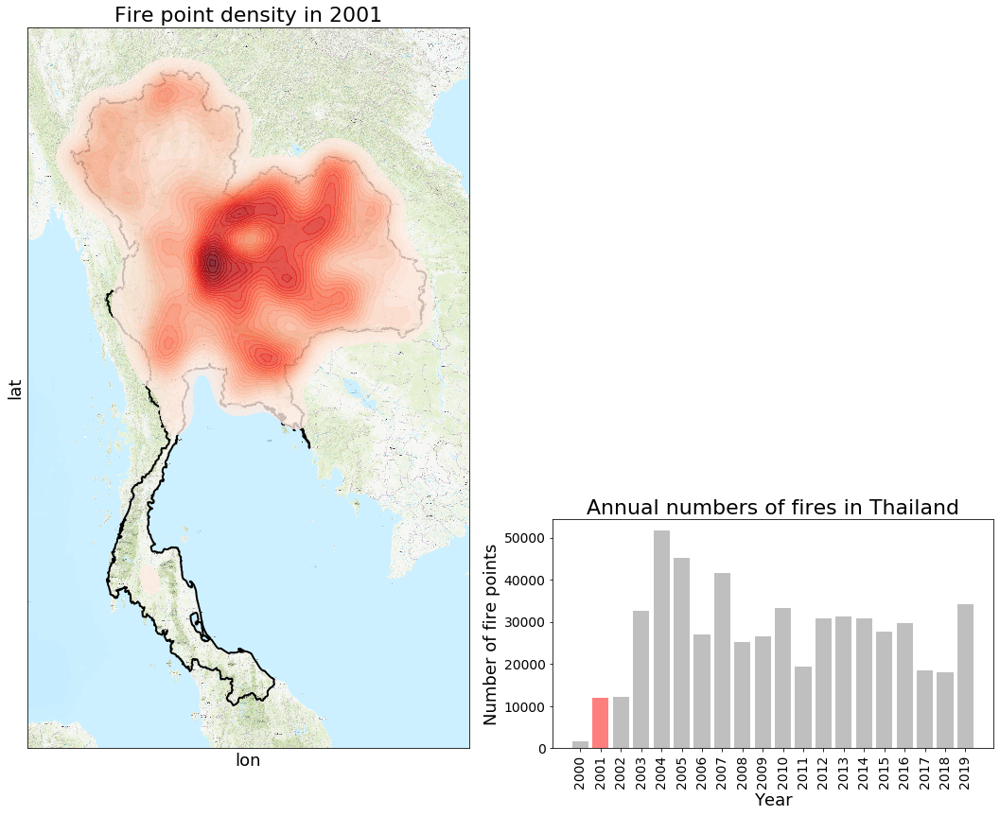

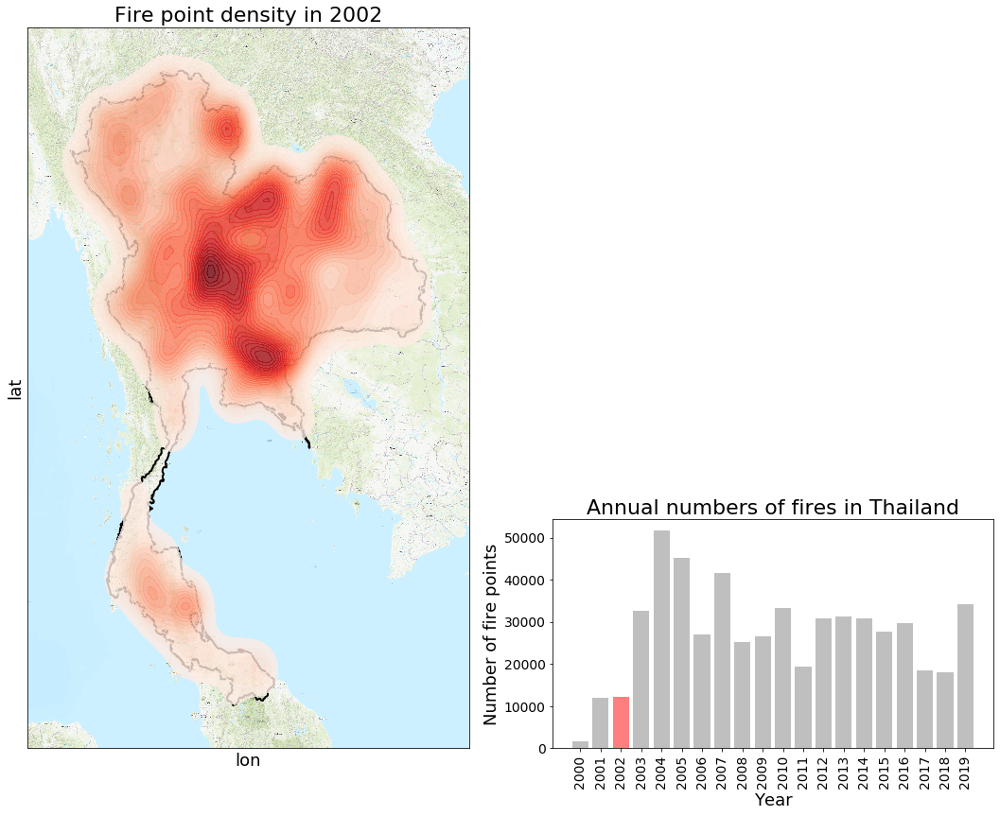

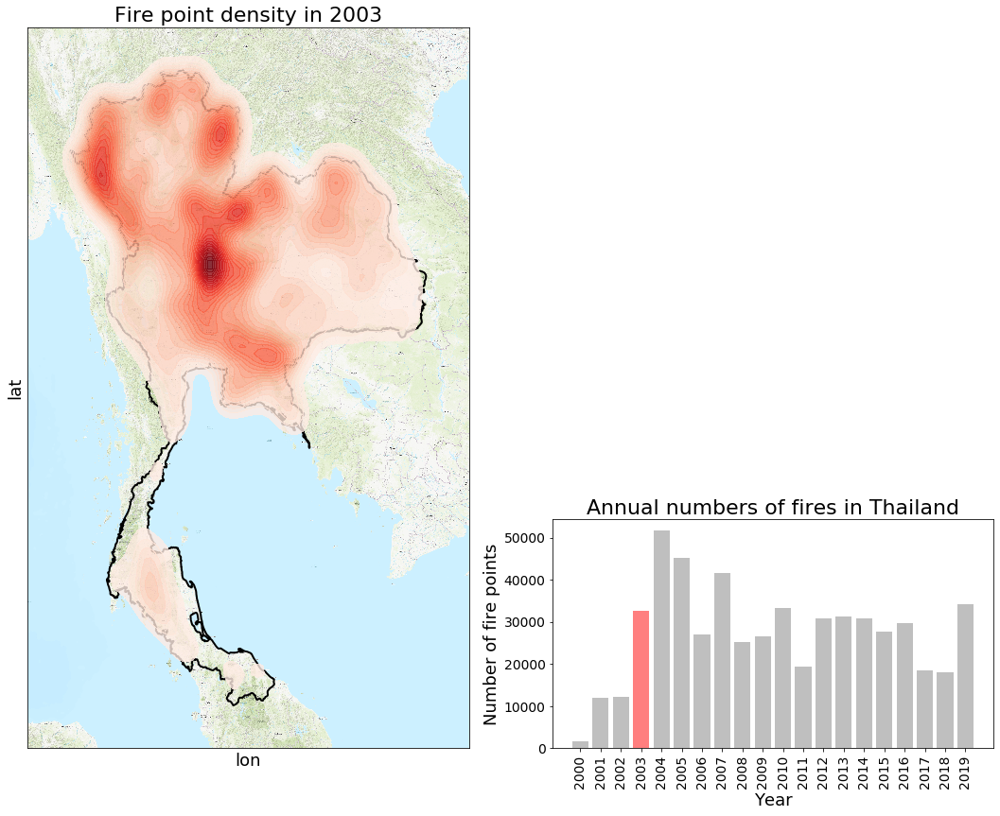

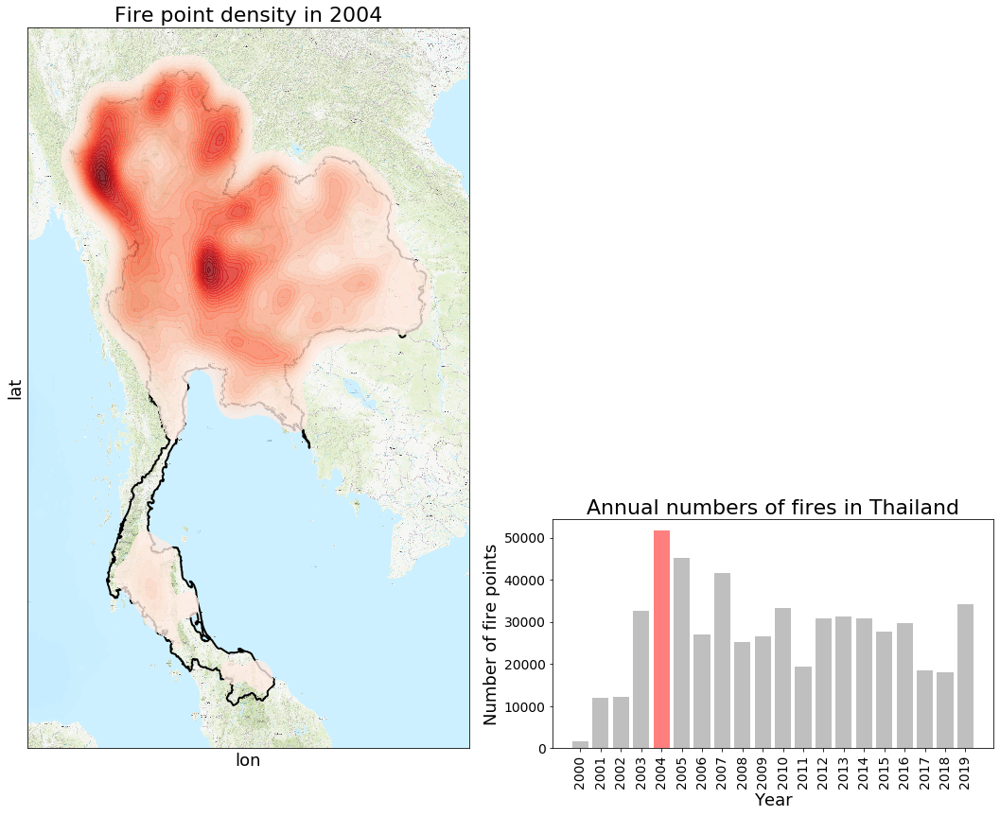

...

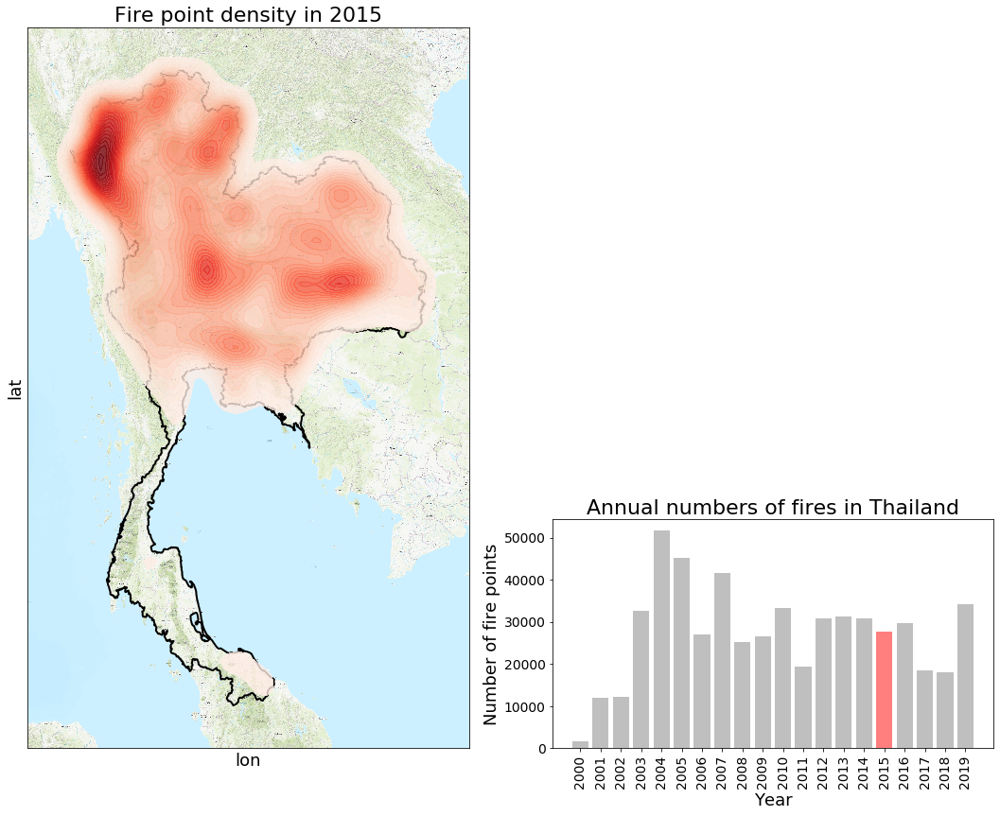

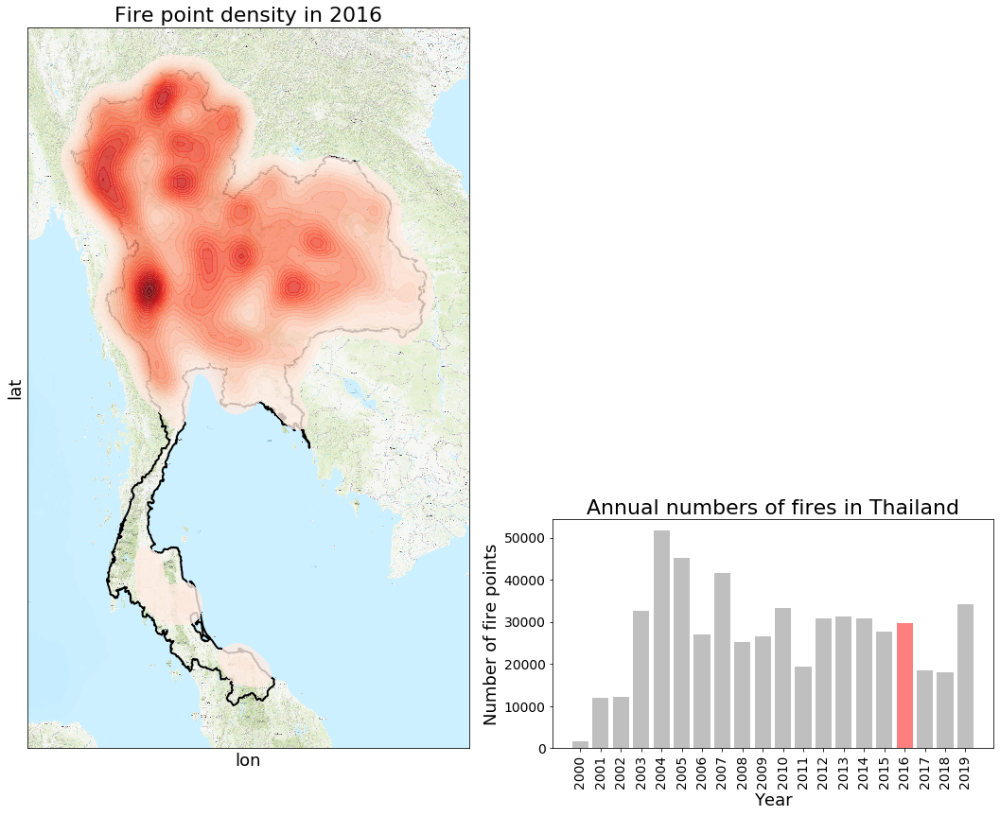

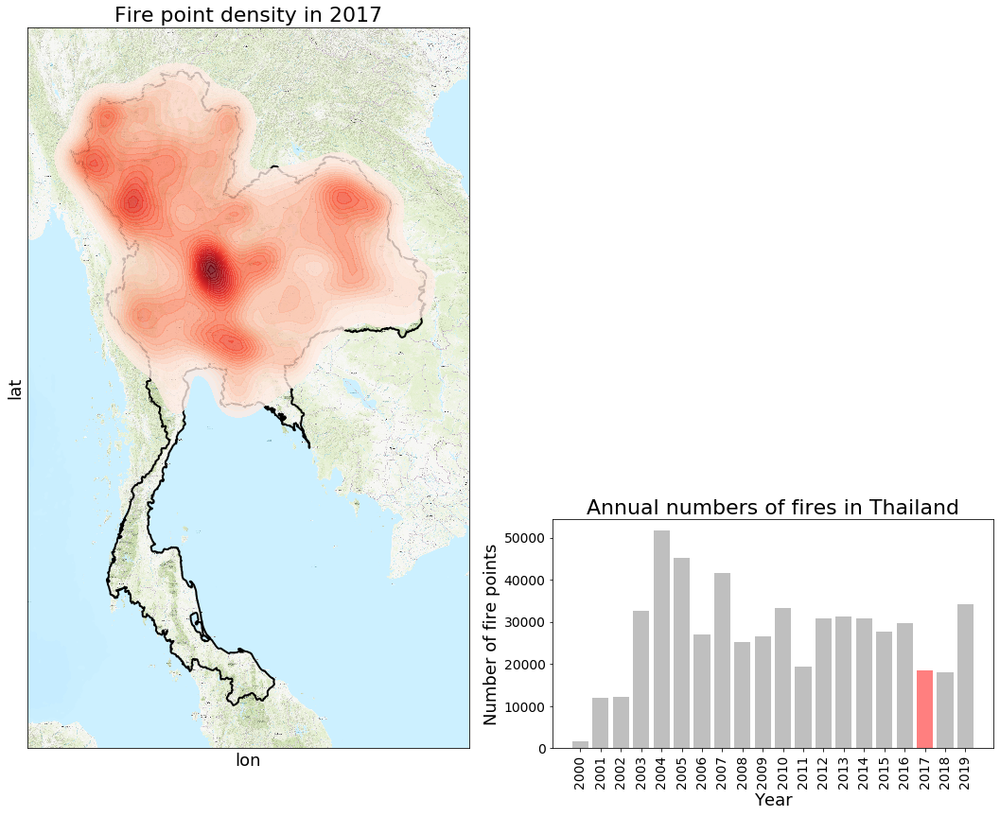

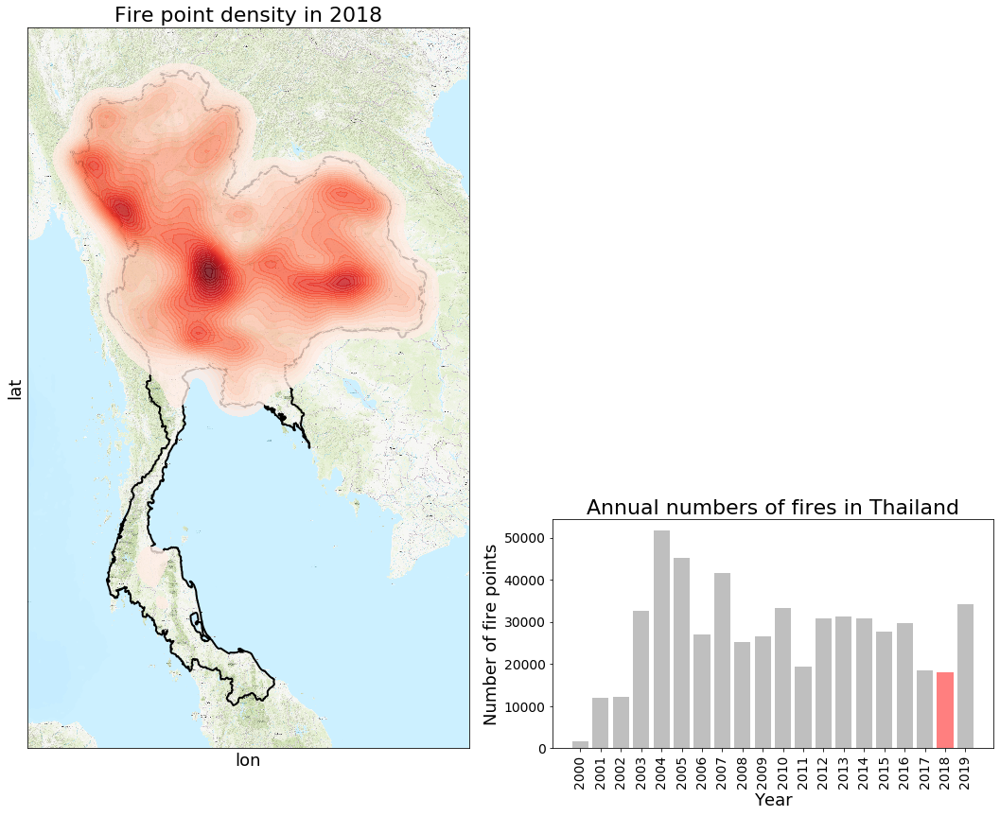

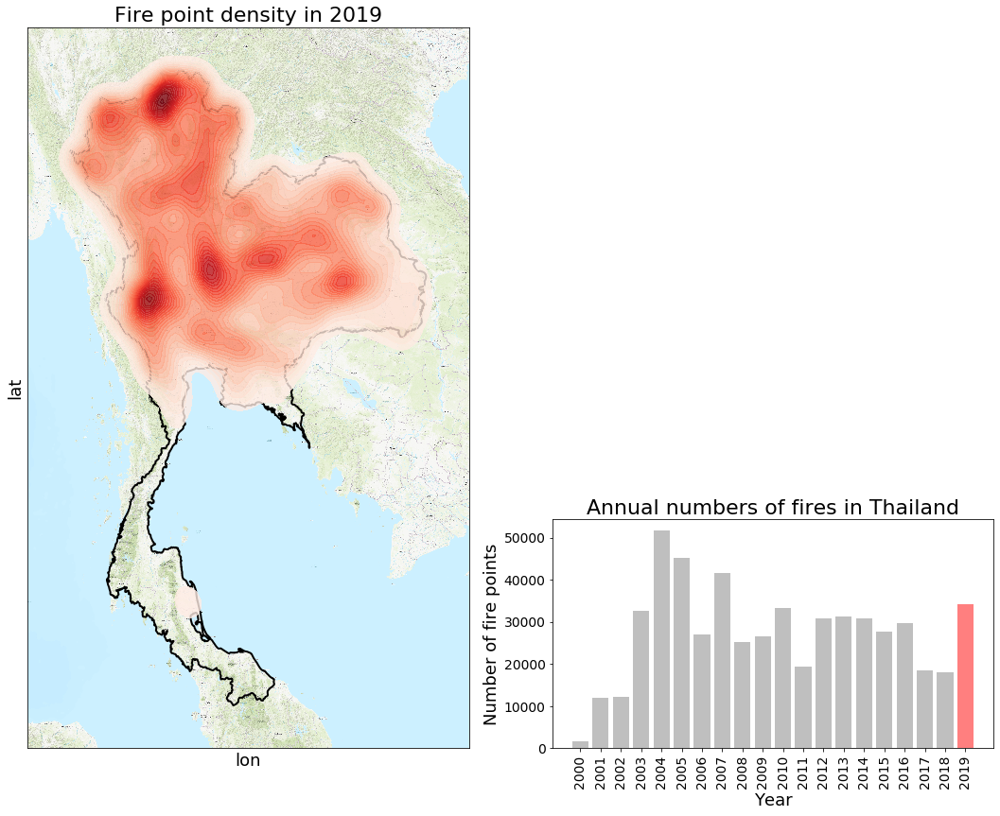

In [63]:
i=0
for year in year_ls:
    
    fig = plt.figure(figsize=(15, 12), constrained_layout=True) 
    gs = gridspec.GridSpec(2, 2, height_ratios=[2, 1],width_ratios=[1, 1]) 
    
    ax0=plt.subplot(gs[:, 0])
    ax1=plt.subplot(gs[1, 1])
    
    ## ------------ plot kernel density map --------------------

    # add a basemap as the bottom layer
    map = Basemap(llcrnrlon=ll_lon_th,llcrnrlat=ll_lat_th,urcrnrlon=ur_lon_th,urcrnrlat=ur_lat_th, epsg=4269, ax=ax0)
    map.arcgisimage(service='World_Topo_Map', xpixels = 2000, verbose= True)


    thailand.plot(color=None, facecolor='none', edgecolors="black",linewidth =2,ax=ax0)
    
    modis_df_th_y = modis_df_th[modis_df_th['date_time'].dt.year == year]
    sns.kdeplot(modis_df_th_y['lon'], modis_df_th_y['lat'],shade= True,  n_levels=30, shade_lowest=False,cmap=plt.cm.Reds,alpha = 0.8, ax=ax0);

    ax0.set_title('Fire point density in '+str(year),fontsize = BIGGER_SIZE)
        ## ------------ plot bar chart --------------------
    
    color_ls = ['grey']*len(year_ls)
    color_ls[i]='red'

    ax1.bar(y_pos, num_f, color=color_ls, align='center', alpha=0.5)
    ax1.set_xticks(y_pos)
    ax1.set_xticklabels(year_ls,rotation=90)
    ax1.set_ylabel('Number of fire points',fontsize = MEDIUM_SIZE)
    ax1.set_xlabel('Year',fontsize = MEDIUM_SIZE)
    ax1.set_title('Annual numbers of fires in Thailand',fontsize = BIGGER_SIZE)
    
    plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
    fig.tight_layout()
    
    i=i+1
    #if i>=1: break
        
    fn = "I:/Thailand_Haze/Python_data/figures/"+str(year)+'.png'
    plt.savefig(fn, dpi=300)


### Fire point density per month

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  del sys.path[0]


http://server.arcgisonline.com/ArcGIS/rest/services/World_Topo_Map/MapServer/export?bbox=96.3452606201172,4.631110191345216,106.63942718505862,21.45527267456054&bboxSR=4269&imageSR=4269&size=2000,3268&dpi=96&format=png32&transparent=true&f=image


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:37: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


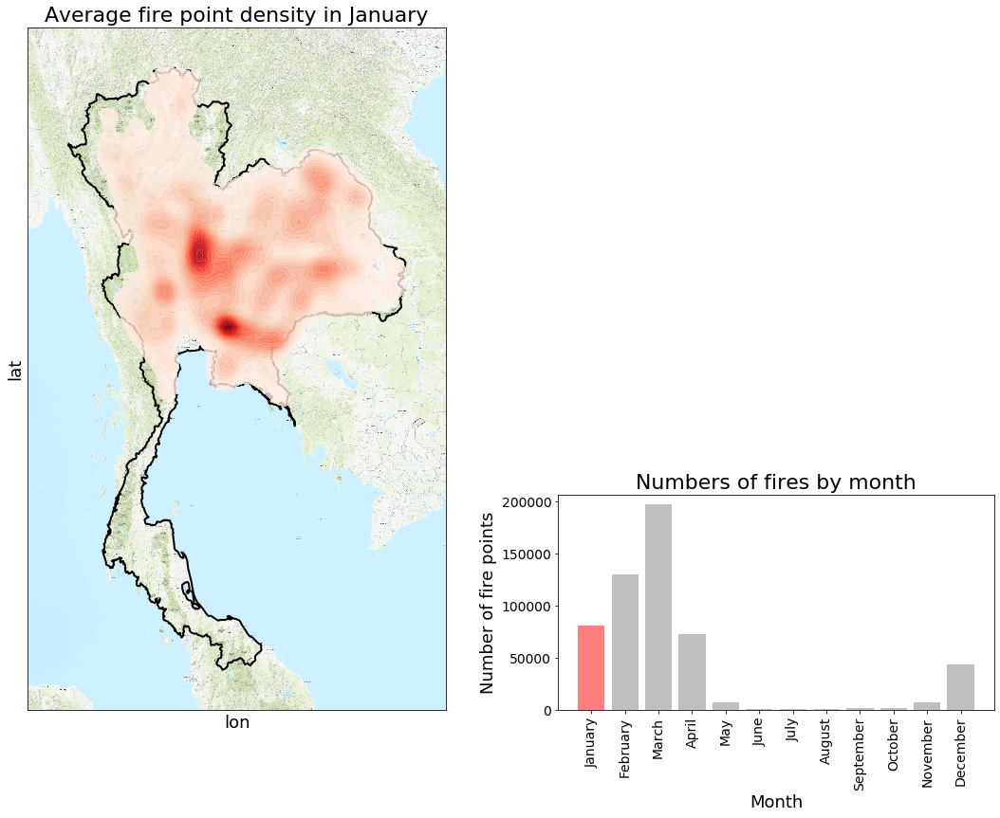

In [89]:
i=0
for month in month_ls:
    
    fig = plt.figure(figsize=(15, 12), constrained_layout=True) 
    gs = gridspec.GridSpec(2, 2, height_ratios=[2, 1],width_ratios=[1, 1]) 
    
    ax0=plt.subplot(gs[:, 0])
    ax1=plt.subplot(gs[1, 1])
    
    ## ------------ plot kernel density map --------------------

    # add a basemap as the bottom layer
    map = Basemap(llcrnrlon=ll_lon_th,llcrnrlat=ll_lat_th,urcrnrlon=ur_lon_th,urcrnrlat=ur_lat_th, epsg=4269, ax=ax0)
    map.arcgisimage(service='World_Topo_Map', xpixels = 2000, verbose= True)


    thailand.plot(color=None, facecolor='none', edgecolors="black",linewidth =2,ax=ax0)
    
    modis_df_th_m = modis_df_th[modis_df_th['date_time'].dt.month == month]
    sns.kdeplot(modis_df_th_m['lon'], modis_df_th_m['lat'],shade= True,  n_levels=30, shade_lowest=False,cmap=plt.cm.Reds,alpha = 0.8, ax=ax0);

    ax0.set_title('Average fire point density in '+str(month_ls_tx[i]),fontsize = BIGGER_SIZE)
    
    ## ------------ plot bar chart --------------------
    
    color_ls = ['grey']*len(month_ls)
    color_ls[i]='red'

    ax1.bar(y_pos, num_f, color=color_ls, align='center', alpha=0.5)
    ax1.set_xticks(y_pos)
    ax1.set_xticklabels(month_ls_tx,rotation=90)
    ax1.set_ylabel('Number of fire points',fontsize = MEDIUM_SIZE)
    ax1.set_xlabel('Month',fontsize = MEDIUM_SIZE)
    ax1.set_title('Numbers of fires by month',fontsize = BIGGER_SIZE)
    
    plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
    fig.tight_layout()
        
    fn = "I:/Thailand_Haze/Python_data/figures/"+str(i)+'_'+str(month_ls_tx[i])+'.png'
    plt.savefig(fn, dpi=300)

    i=i+1
    #if i>=1: break
